# import Liberaries

In [1]:
# Common imports

import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from skimage.color import rgb2gray
from skimage.transform import resize
from sklearn.metrics import confusion_matrix
from sklearn.linear_model import LogisticRegression
from skimage.io import imread_collection
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import cross_val_predict
from sklearn.preprocessing import label_binarize
from skimage import  io
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split

import warnings
warnings.filterwarnings("ignore", category=np.VisibleDeprecationWarning)

# Read images and labeled them in Dataframe

In [2]:
# Create a DataFrame 
df = pd.DataFrame(columns=['img','new_img', 'class']) 

# List of folders path
path=['D:\\New folder\\Sample009\\*.png','D:\\New folder\\Sample017\\*.png','D:\\New folder\\Sample051\\*.png','D:\\New folder\\Sample053\\*.png']

# images of each path 
label=['eight','G','o','q']

# read images and add them in the DataFrame 
for i in range(len(path)) :
    seq = imread_collection(path[i], conserve_memory=True)
    df2 = pd.DataFrame({'img':seq,'class':label[i]})
    df = df.append(df2, ignore_index=True)


# preprocessing (resize,gray,flatten)

In [3]:
#Function  For preprocessing (resize,gray,flatten)

def prepro(img,widht=150,height=150):
    img_resized = resize(rgb2gray(img), (widht, height),anti_aliasing=True).flatten()
    return img_resized
 

In [4]:
# save preprocessing images in the DataFrame 

for i in range(df['class'].shape[0]):
    df['new_img'][i]=prepro(df['img'][i],150,150)
    

<ipython-input-3-2a981296ff2c>:4: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
  img_resized = resize(rgb2gray(img), (widht, height),anti_aliasing=True).flatten()


In [5]:
# the DataFrame 
df.head(5)

,img,new_img,class
0,"[[[31, 43, 33], [32, 43, 35], [34, 44, 36], [3...","[0.15522067472766818, 0.15552928300653532, 0.1...",eight
1,"[[[202, 209, 219], [201, 210, 217], [203, 210,...","[0.8198140743529412, 0.8198936426666668, 0.819...",eight
2,"[[[49, 62, 96], [46, 59, 94], [46, 59, 94], [4...","[0.2408908901960785, 0.24352273594771248, 0.24...",eight
3,"[[[108, 123, 128], [109, 124, 127], [110, 125,...","[0.47216351982570814, 0.4717059895424837, 0.47...",eight
4,"[[[40, 38, 43], [40, 39, 44], [40, 44, 45], [4...","[0.15255231712418296, 0.15277129176470589, 0.1...",eight


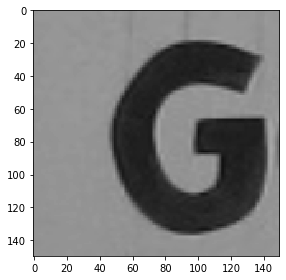

In [6]:
#Function to show image 

def show(img):
    io.imshow(img.reshape(150,150))
    plt.show()
    
show(df['new_img'][150])

# Function to plot ROC curve for multi-class
 to illustrates the diagnostic ability of a binary classifier system as its discrimination threshold is varied

In [7]:

def plot_multiclass_roc(clf, X_test, y_test, n_classes, figsize=(8, 6)):
    
        y_score = clf.decision_function(X_test)

        # structures
        fpr = dict()
        tpr = dict()
        roc_auc = dict()

        # calculate dummies once
        y_test_dummies = pd.get_dummies(y_test, drop_first=False).values
        for i in range(n_classes):
            fpr[i], tpr[i], _ = roc_curve(y_test_dummies[:, i], y_score[:, i])
            roc_auc[i] = auc(fpr[i], tpr[i])

        # roc for each class
        fig, ax = plt.subplots(figsize=figsize)
        ax.plot([0, 1], [0, 1], 'k--')
        ax.set_xlim([0.0, 1.0])
        ax.set_ylim([0.0, 1.05])
        ax.set_xlabel('False Positive Rate')
        ax.set_ylabel('True Positive Rate')
        ax.set_title('Receiver operating characteristic example')
        for i in range(n_classes):
            ax.plot(fpr[i], tpr[i], label='ROC curve (area = %0.2f) for label %i' % (roc_auc[i], i))
        ax.legend(loc="best")
        ax.grid(alpha=.4)
        plt.show()

   

# function calculate recall,precision,f1_Score,accurracy

In [8]:

def report(confusionmatrix , n_classes , X_test):
    recall = np.diag(confusionmatrix) / np.sum(confusionmatrix, axis = 1)
    recall[np.isnan(recall)] = 0

    precision = np.diag(confusionmatrix) / np.sum(confusionmatrix, axis = 0)
    precision[np.isnan(precision)] = 0
    

    f1_Score=(2 * precision * recall) / (precision + recall)
    f1_Score[np.isnan(f1_Score)] = 0
    

    accurracy= sum(np.diag(confusionmatrix))/len(X_test)

    recall_avg= sum(recall)/n_classes
    precision_avg= sum(precision)/n_classes
    f1_avg= sum(f1_Score)/n_classes
    
    for i in range(n_classes) :
        print(" class ",i," : \n___________\n","precision : ",precision[i],"recall : ",recall[i],"f1_Score : ",f1_Score[i])
    print('__________________________________')
    print('Average recall :',recall_avg)

    print('Average precision:',precision_avg)

    print('f1_Score :',f1_avg)

    print('accuracy :',accurracy)
    

# function split the data to (train 60%, validate 20%, test 20%) with stratified sample or not

In [9]:
#function split the data random or  stratified sample 
def split_stratify(df , state='stratify'):
    if (state =='stratify'):
        X, y = df["new_img"], df["class"]
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42,stratify=y)
        X_test, X_val, y_test, y_val = train_test_split(X_test, y_test, test_size=0.5, random_state=42,stratify=y_test)  
        
    else :
        X, y = df["new_img"], df["class"]
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)
        X_test, X_val, y_test, y_val = train_test_split(X_test, y_test, test_size=0.5, random_state=42)
        
    print('train : {0} , test: {1} ,validate :{2}'.format(X_train.shape[0],X_test.shape[0],X_val.shape[0]))     
    print('__________________________________')
    print('train :  \n{0} '.format(y_train.value_counts()))
    print('__________________________________')
    print('test:  \n{0}'.format(y_test.value_counts()))
    print('__________________________________')
    print('validate :\n{0}'.format(y_val.value_counts()))
    print('__________________________________')  
    return list(X_train), list(y_train),list(X_test), list(y_test),list(X_val),list( y_val)

# The explanation : 
1] i split the data to (train, validate, test). but, i will not use validation data set. because, i will not make any parameter selection in this assigment.

2] i wrote 2 options for spliting. first one is split the data with stratify and the second one is split the data with not stratify to compaire between them.

# Function to train and test the model amd print all information.

In [10]:

def model ( df ,n_classes,state):
    X_train, y_train,X_test, y_test,X_validate, y_validate=split_stratify(df,state )
    
    #TRAIN THE MODEL
    bin_clf = LogisticRegression(max_iter=10, tol=0.1, solver='liblinear')
    bin_clf.fit(X_train,y_train)
    
    #TEST THE MODEL on train data
    y_pred = bin_clf.predict(X_train)
    confusionmatrix=confusion_matrix(y_train, y_pred)
    print("Trainingconfusion matrix\n",confusionmatrix)
    print('__________________________________')
    report(confusionmatrix ,n_classes,X_train)
    print('__________________________________')

    
    #TEST THE MODEL on test data
    y_pred = bin_clf.predict(X_test)
    confusionmatrix=confusion_matrix(y_true=y_test, y_pred=y_pred)
    print("Testing confusion matrix\n",confusionmatrix)
    print('__________________________________')
    report(confusionmatrix ,n_classes,X_test)
    print('__________________________________')

    
    #roc graph for binary classfication
    if(n_classes==2):  
        
        y_scores = cross_val_predict(bin_clf, X_train, y_train, cv=5,method="decision_function")
        fpr, tpr, thresholds = roc_curve(y_train, y_scores)
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, linewidth=2, label=label)
        plt.plot([0, 1], [0, 1], 'k--')
        plt.axis([0, 1, 0, 1])
        plt.xlabel('False Positive Rate', fontsize=16)
        plt.ylabel('True Positive Rate', fontsize=16)
        plt.figure(figsize=(8, 6))
        plt.show()
        print("auc : ",roc_auc)
        
    else :
        plot_multiclass_roc(bin_clf, X_test, y_test, n_classes=4, figsize=(16, 10))
        
    return X_test,y_test,X_train,y_pred
    


In [11]:
#Function to plot misclassified images and Train data images
def plot_images(X_test,y_test,X_train,y_pred):
    print('############################ misclassified images #################################')
    for i in range(len(X_test)):
        if (y_pred[i] !=y_test[i] ):
            show(X_test[i])

    print('############################ Train data images #################################')
    for i in range(len(X_train)):
            show(X_train[i])

# Binary classifier

create dataframe contains o and q, then classify them as 0 for o and 1 for q.
create dataframe contains binary classifier for eight and G,then classify them as 0 for eight and 1 for G.

In [12]:
#Dataframe contain o and q only
o= df[df["class"] == 'o']
o["class"]=0
q = df[df["class"] == 'q']
q["class"]=1
oq_df= pd.DataFrame(columns=['img','new_img', 'class']) 
oq_df=pd.concat([o, q])
oq_df['class'].value_counts()

<ipython-input-12-9583db305f18>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  o["class"]=0
<ipython-input-12-9583db305f18>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  q["class"]=1


0    148
1     54
Name: class, dtype: int64

In [13]:
#Dataframe contain 8 and G only
eight= df[df["class"] == 'eight' ]
eight["class"]=1
G = df[df["class"] == 'G']
G["class"]=0
G8_df= pd.DataFrame(columns=['img','new_img', 'class'])
G8_df=pd.concat([eight, G])  
G8_df['class'].value_counts()

<ipython-input-13-bc63ecece039>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  eight["class"]=1
<ipython-input-13-bc63ecece039>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  G["class"]=0


0    143
1     32
Name: class, dtype: int64

# train the model on o&q dataframe with stratify

train : 121 , test: 40 ,validate :41
__________________________________
train :  
0    89
1    32
Name: class, dtype: int64 
__________________________________
test:  
0    29
1    11
Name: class, dtype: int64
__________________________________
validate :
0    30
1    11
Name: class, dtype: int64
__________________________________
Trainingconfusion matrix
 [[89  0]
 [ 0 32]]
__________________________________
 class  0  : 
___________
 precision :  1.0 recall :  1.0 f1_Score :  1.0
 class  1  : 
___________
 precision :  1.0 recall :  1.0 f1_Score :  1.0
__________________________________
Average recall : 1.0
Average precision: 1.0
f1_Score : 1.0
accuracy : 1.0
__________________________________
Testing confusion matrix
 [[28  1]
 [ 8  3]]
__________________________________
 class  0  : 
___________
 precision :  0.7777777777777778 recall :  0.9655172413793104 f1_Score :  0.8615384615384615
 class  1  : 
___________
 precision :  0.75 recall :  0.2727272727272727 f1_Score :  0.39999999

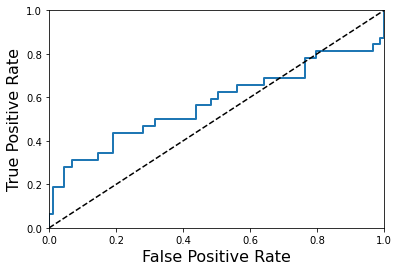

<Figure size 576x432 with 0 Axes>

auc :  0.5726825842696628


In [14]:
X_test,y_test,X_train,y_pred=model(oq_df ,2,'stratify')

############################ misclassify images #################################


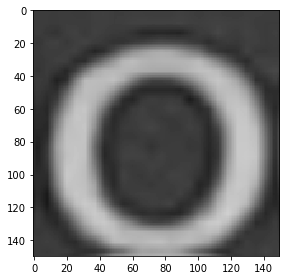

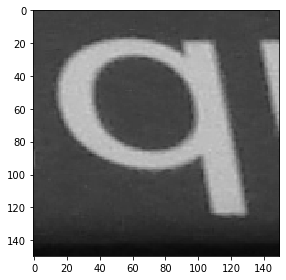

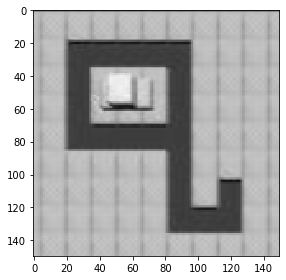

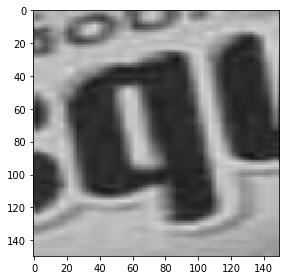

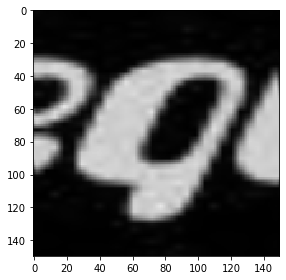

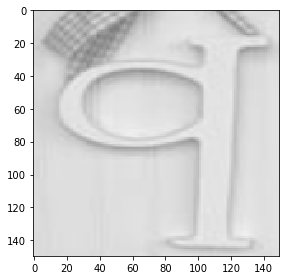

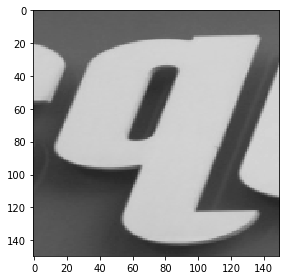

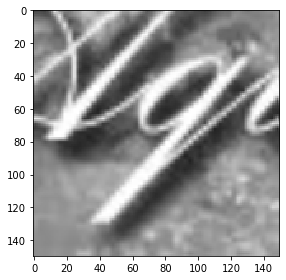

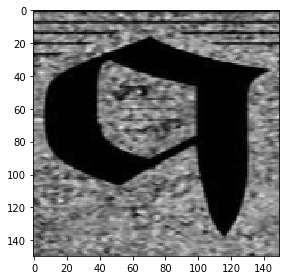

############################ Train data images #################################


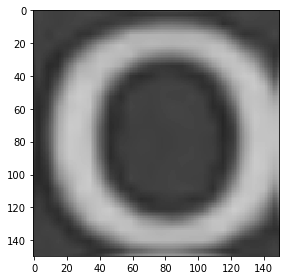

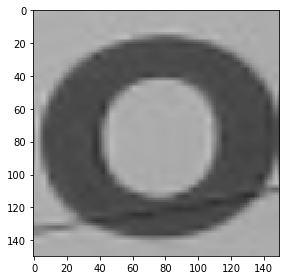

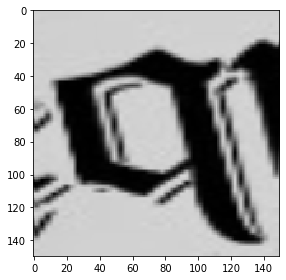

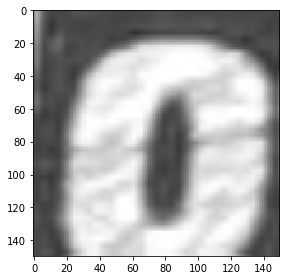

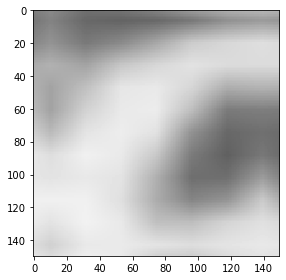

...

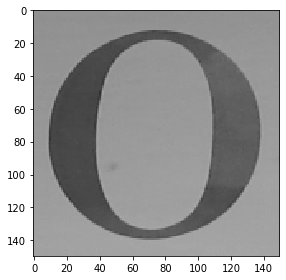

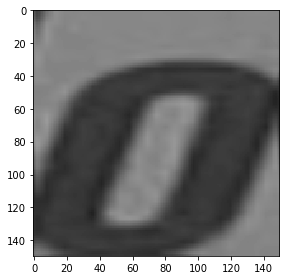

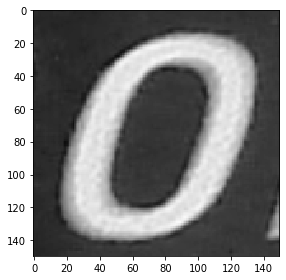

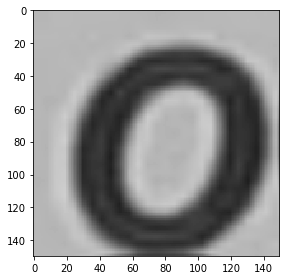

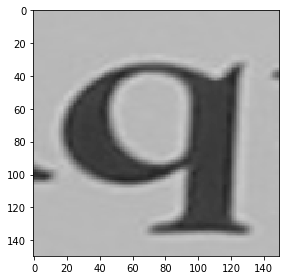

In [15]:
plot_images(X_test,y_test,X_train,y_pred)

# The explanation : 
1] as showen the Train dataset is imbalance .. 
   'class o' has 89 atributes vs  32 atributes for 'class q'.
   
2] the model can train all training data set as showen in Training confusion matrix.

3] The imbalance data made the model bais to 'class o'. so,  in Testing confusion matrix the model was able to classify 28 over    29 images of 'class o' and missclassify 8 over 11 attribute of 'class q' and classify them as 'class o'. that main that the    model is bais more for 'class o'.

   so, 'class o' has high precision & recall unlike 'class q'the model was able to correctly classify only 3 images. so, it has    very low recall. Despite all this, 'class q' has high precision that because the model misclass only 1 image of 'class o' as 'class q'.
   
4] one of reason is the lake of images of 'class q' in the train data. 

# train the model on o&q dataframe with not stratify


train : 121 , test: 40 ,validate :41
__________________________________
train :  
0    87
1    34
Name: class, dtype: int64 
__________________________________
test:  
0    28
1    12
Name: class, dtype: int64
__________________________________
validate :
0    33
1     8
Name: class, dtype: int64
__________________________________
Trainingconfusion matrix
 [[87  0]
 [ 0 34]]
__________________________________
 class  0  : 
___________
 precision :  1.0 recall :  1.0 f1_Score :  1.0
 class  1  : 
___________
 precision :  1.0 recall :  1.0 f1_Score :  1.0
__________________________________
Average recall : 1.0
Average precision: 1.0
f1_Score : 1.0
accuracy : 1.0
__________________________________
Testing confusion matrix
 [[28  0]
 [ 8  4]]
__________________________________
 class  0  : 
___________
 precision :  0.7777777777777778 recall :  1.0 f1_Score :  0.8750000000000001
 class  1  : 
___________
 precision :  1.0 recall :  0.3333333333333333 f1_Score :  0.5
______________________

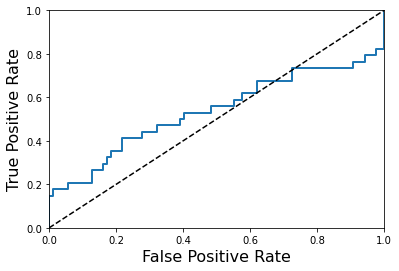

<Figure size 576x432 with 0 Axes>

auc :  0.5354969574036511


In [16]:
X_test,y_test,X_train,y_pred=model(oq_df ,2,'notstratify')

############################ misclassify images #################################


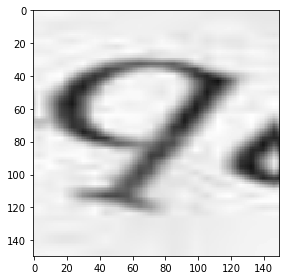

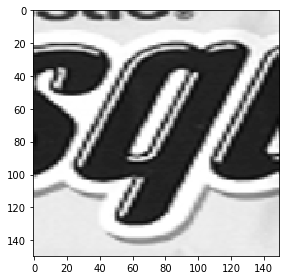

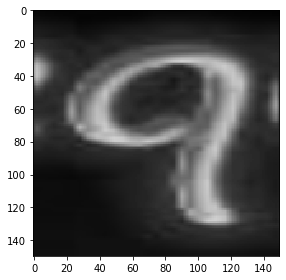

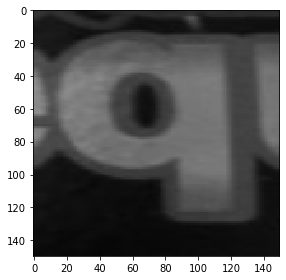

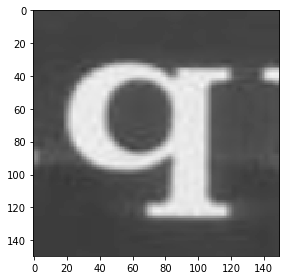

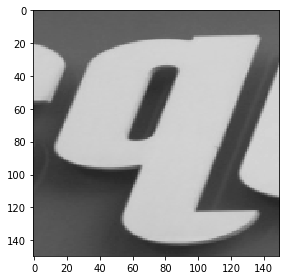

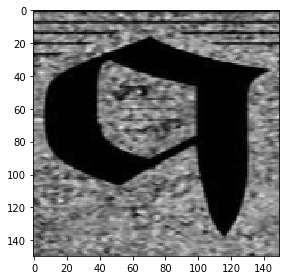

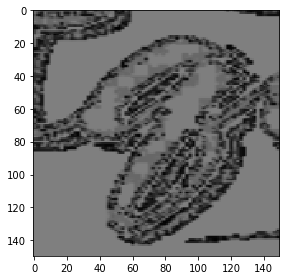

############################ Train data images #################################


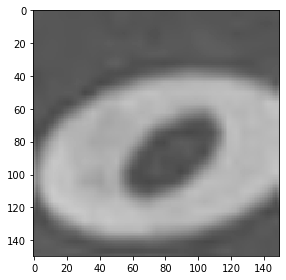

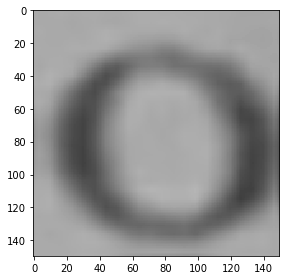

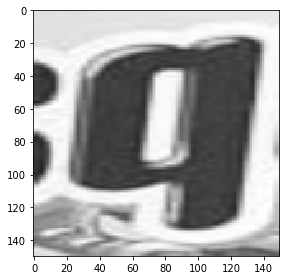

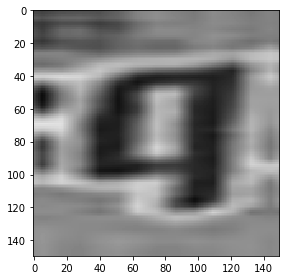

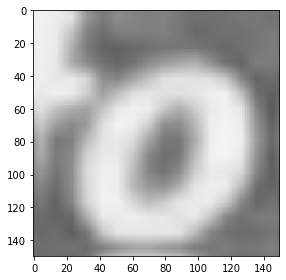

...

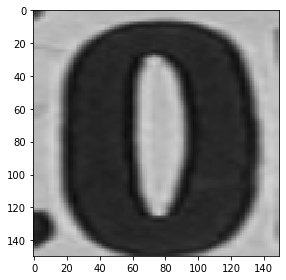

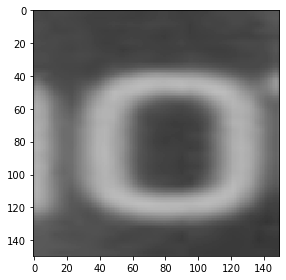

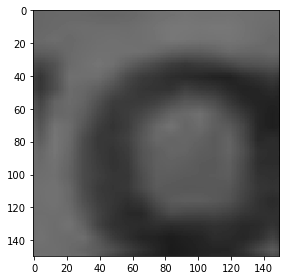

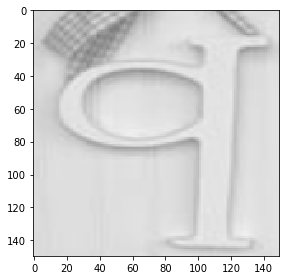

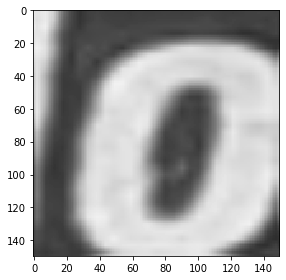

In [17]:
plot_images(X_test,y_test,X_train,y_pred)

# The explanation : 
1] as showen the Train dataset is imbalance .. 
   'class o' has 87 atributes vs  34 atributes for 'class q'.
   
2] the model can train all training data set as showen in Training confusion matrix.

3] The imbalance data made the model bais to 'class o'. so, in Testing confusion matrix the model was able to classify all images of 'class o' and missclassify 8 over 12 attribute of 'class q' and classify them as 'class o'. that main that the    model is bais more for 'class o'.

   so, 'class o' has recall=1 because the model didn't misclassify 'class q' as 'class o' but has percision=0.778. because, it missclasify 8 'class q' as 'class o'. 
   
   unlike 'class q'the model was able to correctly classify only 4 images. so, it has very low recall. Despite all this, 'class q' has high precision that because the model didn't misclassify any image of 'class o' as 'class q'.

4] in addition to the lake of images of 'class q' in the train data.the images have noice 

# train the model on G&8 dataframe with stratify

train : 105 , test: 35 ,validate :35
__________________________________
train :  
0    86
1    19
Name: class, dtype: int64 
__________________________________
test:  
0    28
1     7
Name: class, dtype: int64
__________________________________
validate :
0    29
1     6
Name: class, dtype: int64
__________________________________


C:\Users\Dina\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


Trainingconfusion matrix
 [[86  0]
 [ 0 19]]
__________________________________
 class  0  : 
___________
 precision :  1.0 recall :  1.0 f1_Score :  1.0
 class  1  : 
___________
 precision :  1.0 recall :  1.0 f1_Score :  1.0
__________________________________
Average recall : 1.0
Average precision: 1.0
f1_Score : 1.0
accuracy : 1.0
__________________________________
Testing confusion matrix
 [[26  2]
 [ 5  2]]
__________________________________
 class  0  : 
___________
 precision :  0.8387096774193549 recall :  0.9285714285714286 f1_Score :  0.8813559322033899
 class  1  : 
___________
 precision :  0.5 recall :  0.2857142857142857 f1_Score :  0.36363636363636365
__________________________________
Average recall : 0.6071428571428572
Average precision: 0.6693548387096775
f1_Score : 0.6224961479198767
accuracy : 0.8
__________________________________


C:\Users\Dina\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
C:\Users\Dina\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
C:\Users\Dina\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


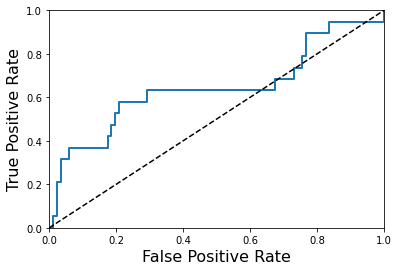

<Figure size 576x432 with 0 Axes>

auc :  0.6419828641370869


In [18]:
X_test,y_test,X_train,y_pred=model(G8_df ,2,'stratify')

############################ misclassify images #################################


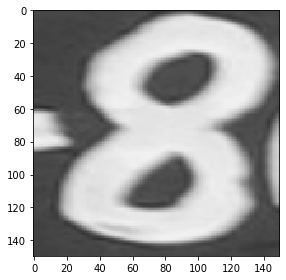

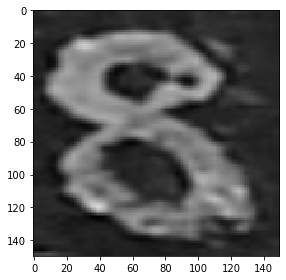

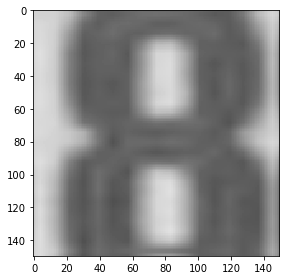

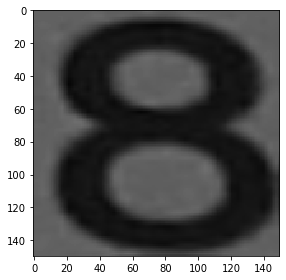

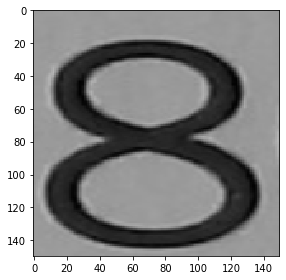

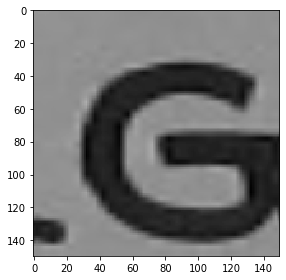

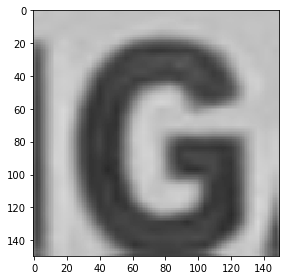

############################ Train data images #################################


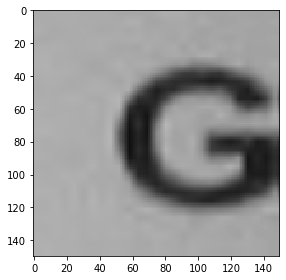

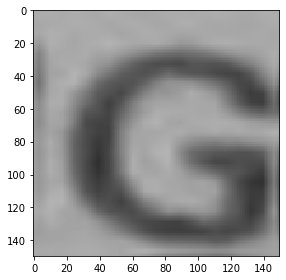

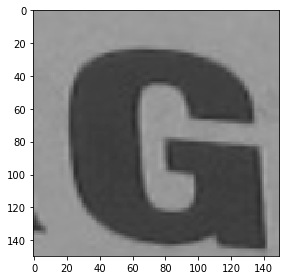

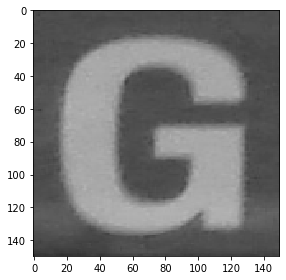

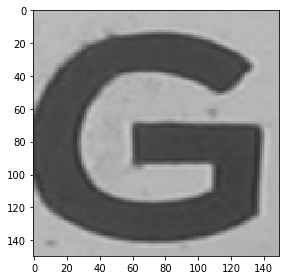

...

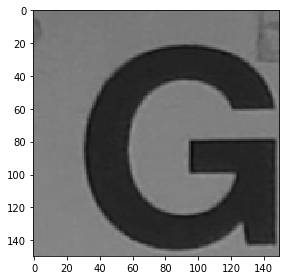

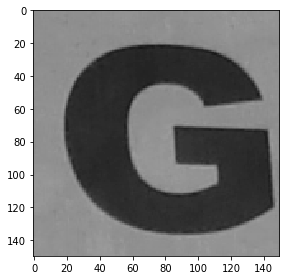

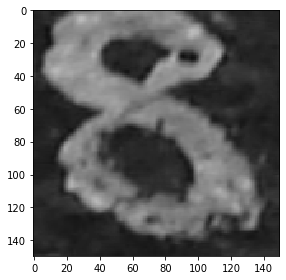

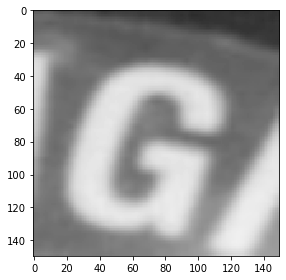

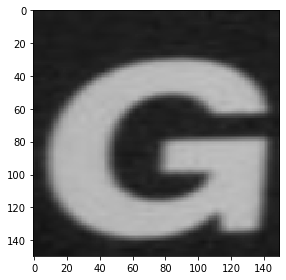

In [19]:
plot_images(X_test,y_test,X_train,y_pred)

# The explanation : 
1] as showen the Train dataset is imbalance .. 
   'class G' has 86 atributes vs  19 atributes for 'class 8'.
   
2] the model can train all training data set as showen in Training confusion matrix.

3] The imbalance data made the model bais to 'class G'. so, in Testing confusion matrix the model was able to classify26 over 28 images of 'class G' and missclassify 5 over 7 attribute of 'class 8' and classify them as 'class G'. that main that the    model is bais more for 'class G'.

   so, 'class G' has high precision & recall unlike 'class q' the model was able to correctly classify only 2 images. so, it hasvery low recall. also, the model misclassify 2 images of 'class G'.so,'class 8'low precision.

# train the model on G&8 dataframe with notstratify

train : 105 , test: 35 ,validate :35
__________________________________
train :  
0    90
1    15
Name: class, dtype: int64 
__________________________________
test:  
0    26
1     9
Name: class, dtype: int64
__________________________________
validate :
0    27
1     8
Name: class, dtype: int64
__________________________________
Trainingconfusion matrix
 [[90  0]
 [ 0 15]]
__________________________________
 class  0  : 
___________
 precision :  1.0 recall :  1.0 f1_Score :  1.0
 class  1  : 
___________
 precision :  1.0 recall :  1.0 f1_Score :  1.0
__________________________________
Average recall : 1.0
Average precision: 1.0
f1_Score : 1.0
accuracy : 1.0
__________________________________
Testing confusion matrix
 [[25  1]
 [ 6  3]]
__________________________________
 class  0  : 
___________
 precision :  0.8064516129032258 recall :  0.9615384615384616 f1_Score :  0.8771929824561403
 class  1  : 
___________
 precision :  0.75 recall :  0.3333333333333333 f1_Score :  0.46153846

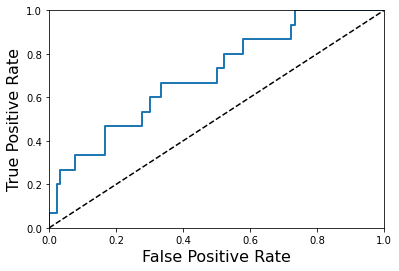

<Figure size 576x432 with 0 Axes>

auc :  0.702962962962963


In [20]:
X_test,y_test,X_train,y_pred=model(G8_df ,2,'notstratify')

############################ misclassify images #################################


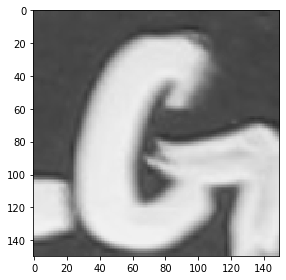

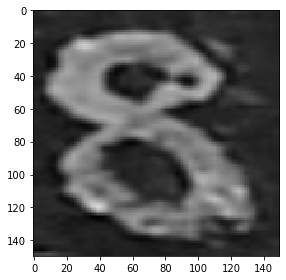

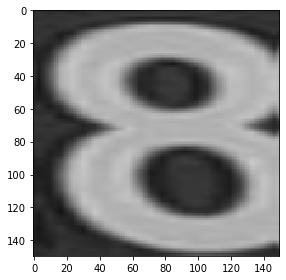

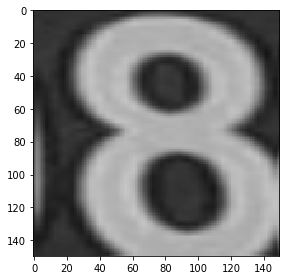

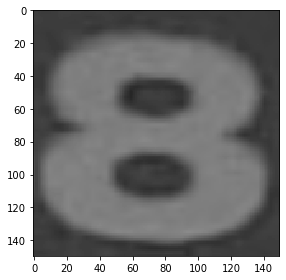

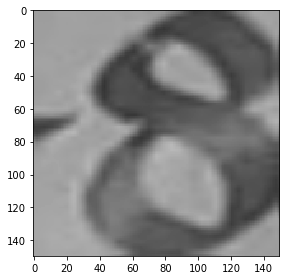

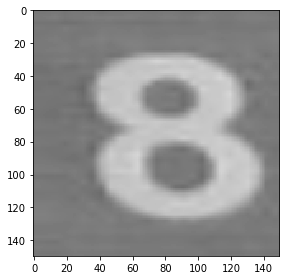

############################ Train data images #################################


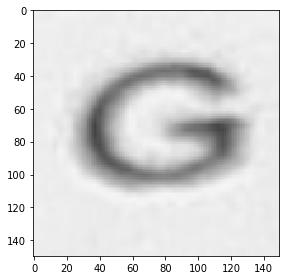

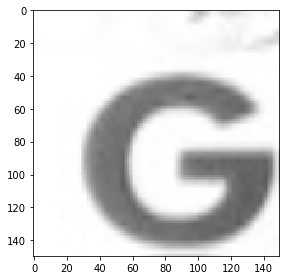

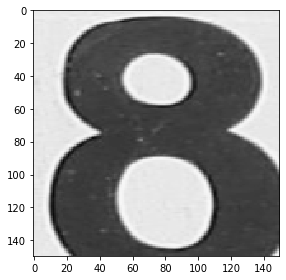

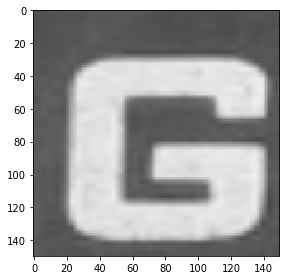

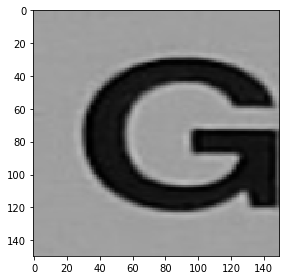

...

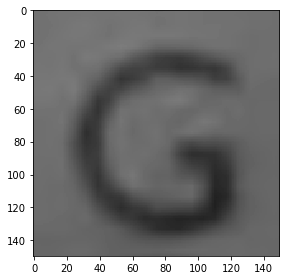

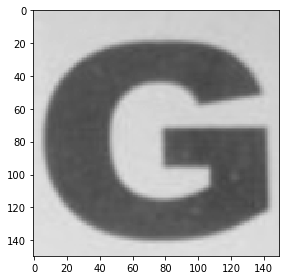

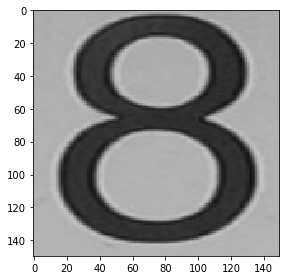

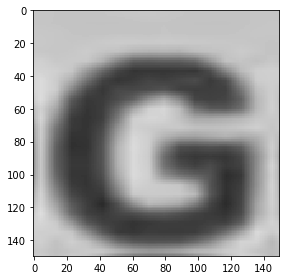

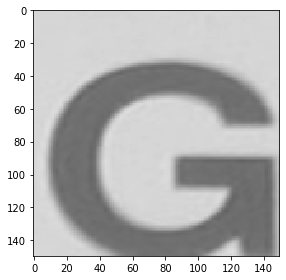

In [21]:
plot_images(X_test,y_test,X_train,y_pred)

# The explanation : 
1] as showen the Train dataset is imbalance .. 
   'class G' has 90 atributes vs  15 atributes for 'class 8'.
   
2] the model can train all training data set as showen in Training confusion matrix.

3] The imbalance data made the model bais to 'class G'. so, in Testing confusion matrix the model was able to classify 25 over 26 images of 'class G' and missclassify 6 over 9 attribute of 'class 8' and classify them as 'class G'. that main that the    model is bais more for 'class G'.

   so, 'class G' has high precision & recall unlike 'class q' the model was able to correctly classify only 2 images. so, it has very low recall.

# Multiclass classification

In [22]:
df['class'].value_counts()

o        148
G        143
q         54
eight     32
Name: class, dtype: int64

train : 226 , test: 75 ,validate :76
__________________________________
train :  
o        89
G        86
q        32
eight    19
Name: class, dtype: int64 
__________________________________
test:  
o        29
G        28
q        11
eight     7
Name: class, dtype: int64
__________________________________
validate :
o        30
G        29
q        11
eight     6
Name: class, dtype: int64
__________________________________


C:\Users\Dina\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


Trainingconfusion matrix
 [[84  0  2  0]
 [ 0 19  0  0]
 [ 0  0 89  0]
 [ 0  0  1 31]]
__________________________________
 class  0  : 
___________
 precision :  1.0 recall :  0.9767441860465116 f1_Score :  0.988235294117647
 class  1  : 
___________
 precision :  1.0 recall :  1.0 f1_Score :  1.0
 class  2  : 
___________
 precision :  0.967391304347826 recall :  1.0 f1_Score :  0.9834254143646408
 class  3  : 
___________
 precision :  1.0 recall :  0.96875 f1_Score :  0.9841269841269841
__________________________________
Average recall : 0.9863735465116279
Average precision: 0.9918478260869565
f1_Score : 0.988946923152318
accuracy : 0.9867256637168141
__________________________________
Testing confusion matrix
 [[ 9  0 19  0]
 [ 2  1  4  0]
 [10  2 16  1]
 [ 3  1  2  5]]
__________________________________
 class  0  : 
___________
 precision :  0.375 recall :  0.32142857142857145 f1_Score :  0.3461538461538462
 class  1  : 
___________
 precision :  0.25 recall :  0.1428571428571428

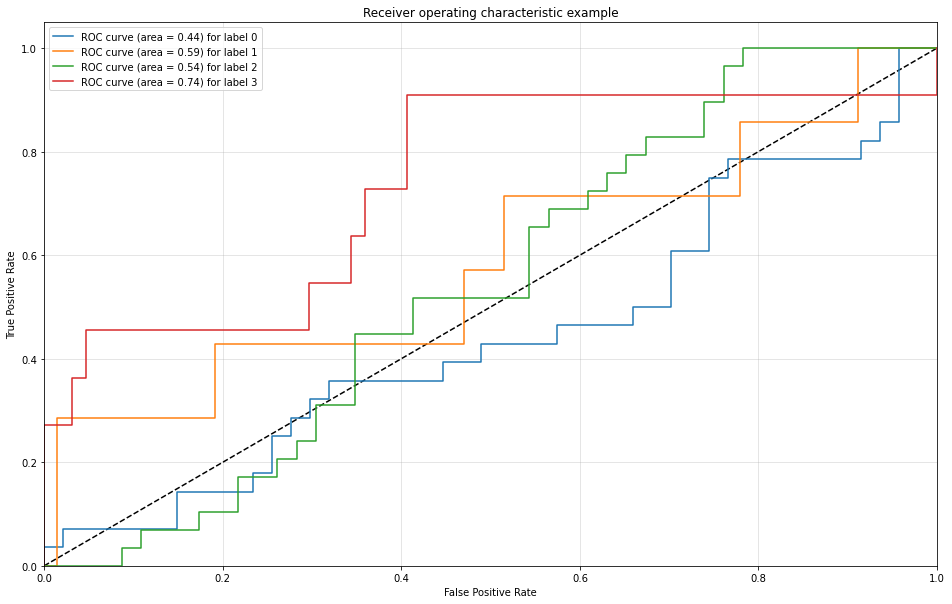

([array([0.27339362, 0.27604222, 0.27213902, ..., 0.2748273 , 0.27478884,
         0.27481494]),
  array([0.39808891, 0.39771301, 0.39769269, ..., 0.39894441, 0.39894441,
         0.39894441]),
  array([0.8452565 , 0.84468133, 0.84243297, ..., 0.85276627, 0.85276627,
         0.85276627]),
  array([0.67225711, 0.66996901, 0.66578637, ..., 0.70877725, 0.70742425,
         0.7069444 ]),
  array([0.41168147, 0.41544618, 0.41144618, ..., 0.40705328, 0.40887962,
         0.40716072]),
  array([0.58750344, 0.58749586, 0.58748828, ..., 0.55348067, 0.55157683,
         0.54967298]),
  array([0.17665517, 0.16506087, 0.17594531, ..., 0.17801138, 0.17801138,
         0.17801138]),
  array([0.93349373, 0.93339948, 0.93349373, ..., 0.92016806, 0.91873843,
         0.92016806]),
  array([0.35682976, 0.35667184, 0.36251487, ..., 0.46442671, 0.46598732,
         0.46594514]),
  array([0.347637  , 0.31113347, 0.27462994, ..., 0.51770852, 0.51651434,
         0.51532017]),
  array([0.41624014, 0.4173045

In [23]:
model(df,4,'stratify')

# The explanation : 
1] as showen the Train dataset is imbalance .. 
     
2] the model can train all training data set as showen in Training confusion matrix but misclassify only one image .

3] The imbalance data made the model confusied between 'class o' and 'class G'

THE BEST roc curve is the red one for 'class q' because the auc = 0.74

train : 226 , test: 75 ,validate :76
__________________________________
train :  
o        99
G        85
q        27
eight    15
Name: class, dtype: int64 
__________________________________
test:  
G        30
o        20
q        14
eight    11
Name: class, dtype: int64
__________________________________
validate :
o        29
G        28
q        13
eight     6
Name: class, dtype: int64
__________________________________


C:\Users\Dina\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


Trainingconfusion matrix
 [[82  0  3  0]
 [ 0 15  0  0]
 [ 1  0 98  0]
 [ 0  0  0 27]]
__________________________________
 class  0  : 
___________
 precision :  0.9879518072289156 recall :  0.9647058823529412 f1_Score :  0.9761904761904762
 class  1  : 
___________
 precision :  1.0 recall :  1.0 f1_Score :  1.0
 class  2  : 
___________
 precision :  0.9702970297029703 recall :  0.98989898989899 f1_Score :  0.98
 class  3  : 
___________
 precision :  1.0 recall :  1.0 f1_Score :  1.0
__________________________________
Average recall : 0.9886512180629828
Average precision: 0.9895622092329714
f1_Score : 0.9890476190476191
accuracy : 0.9823008849557522
__________________________________
Testing confusion matrix
 [[ 7  2 20  1]
 [ 4  1  6  0]
 [ 4  0 16  0]
 [ 9  1  2  2]]
__________________________________
 class  0  : 
___________
 precision :  0.2916666666666667 recall :  0.23333333333333334 f1_Score :  0.2592592592592593
 class  1  : 
___________
 precision :  0.25 recall :  0.09090

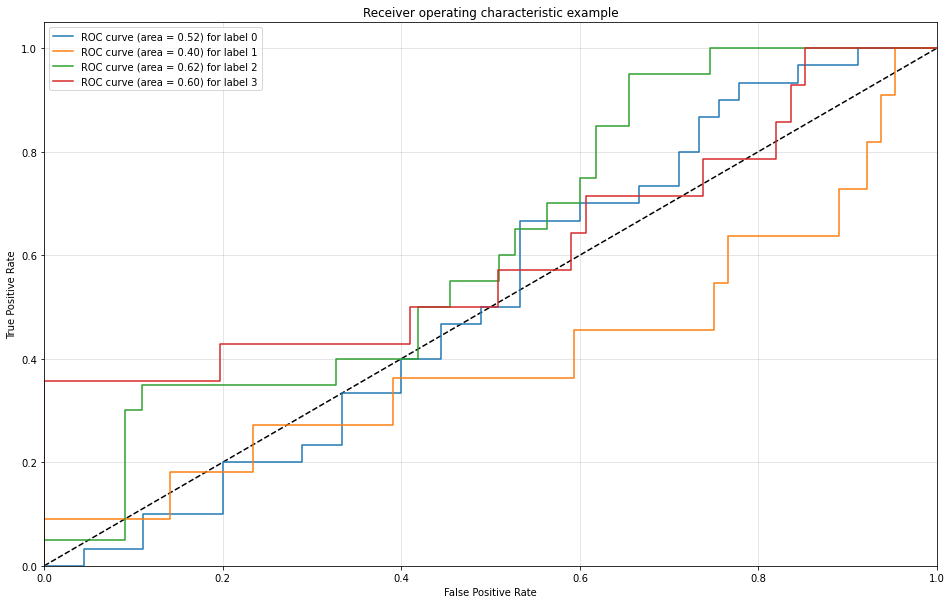

([array([0.26337342, 0.26141856, 0.26960453, ..., 0.29365952, 0.28989136,
         0.29079122]),
  array([0.35531765, 0.3547302 , 0.35414275, ..., 0.36853844, 0.36672118,
         0.36490393]),
  array([0.24062907, 0.23312031, 0.22902462, ..., 0.21805149, 0.2184581 ,
         0.21920355]),
  array([0.74863159, 0.74986598, 0.75189996, ..., 0.78199609, 0.78199609,
         0.78199609]),
  array([0.62306671, 0.62305203, 0.62303735, ..., 0.61895306, 0.62268413,
         0.62641519]),
  array([0.70117216, 0.70117216, 0.70117216, ..., 0.68593856, 0.68227843,
         0.68280131]),
  array([0.09642434, 0.09577545, 0.09688238, ..., 0.10490837, 0.11048211,
         0.10721474]),
  array([0.15187749, 0.13894593, 0.14217882, ..., 0.1745763 , 0.17438044,
         0.17516385]),
  array([0.17161801, 0.17152955, 0.17146873, ..., 0.20115765, 0.19985975,
         0.1979719 ]),
  array([0.71815488, 0.7252503 , 0.72494093, ..., 0.8327617 , 0.83263359,
         0.83284972]),
  array([0.15820029, 0.1559371

In [24]:
model(df,4,'notstratify')

# The explanation : 
1] as showen the Train dataset is imbalance .. 
     
2] the model can train all training data set as showen in Training confusion matrix but misclassify only one image .

3] The imbalance data made the model confusied between 'class o' and 'class G'

THE BEST roc curve is the green one for 'class o' because the auc = 0.62

# Final explanation :

1] it is better to use Stratified Train-Test Splits split the dataset into train and test sets because it is a way that preserves the same proportions of examples in each class as observed in the original dataset. 

1] it is better to Split the data to train and test only. the model need more data to be trainned.